### Machine Learning in Ecommerce
Machine learning (ML) has revolutionized the ecommerce industry, enabling businesses to enhance customer experiences, optimize operations, and boost revenue. In this comprehensive guide, we will delve into the various use cases, provide real-world examples, and offer guidelines for successfully implementing machine learning in ecommerce. From personalized recommendations to fraud detection, machine learning has the potential to transform every aspect of the ecommerce landscape.

Some use case in Ecommerce:\
Product Recommendations\
Customer Churn Prediction\
Inventory Optimization\
Fraud Detection and Prevention\
Dynamic Pricing.

In this ML Project we are focusing on "Customer Churn Prediction".


# Introduction

### Customer Churn Prediction

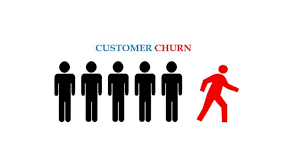

ML can predict when a customer is likely to churn (stop using the platform) based on their behavior. Identifying potential churners allows businesses to take proactive measures to retain customers.

Guidelines for Churn Prediction:

Define churn indicators: Identify key factors that indicate a customer might churn, such as a decrease in usage, a lapse in subscriptions, or negative feedback.

Build predictive models: Utilize classification algorithms like logistic regression or decision trees to predict churn probabilities.

Implement retention strategies: Develop targeted campaigns or offers to re-engage at-risk customers.

Monitor and iterate: Continuously assess the effectiveness of your churn prediction model and refine it as new data becomes available.



### The work flow of the project is given below:

Importing Important Libraries.\
Data Overview.\
EDA (Exploratory Data Analysis).\
Data Preprocessing.\
Modeling.\
Evaluation.

# Data Collection
Ecommerce Customer Churn Analysis and Prediction: Predict customer churn and make suggestions(From kaggle)
Link is below:
https://www.kaggle.com/datasets/ankitverma2010/ecommerce-customer-churn-analysis-and-prediction

### About Dataset:
CustomerID: Unique customer ID\
Churn: Churn Flag\
Tenure: Tenure of customer in organization\
PreferredLoginDevice: Preferred login device of customer\
CityTier: City tier\
WarehouseToHome: Distance in between warehouse to home of customer\
PreferredPaymentMode: Preferred payment method of customer\
Gender: Gender of customer\
HourSpendOnApp: Number of hours spend on mobile application or website\
NumberOfDeviceRegistered: Total number of deceives is registered on particular customer\
PreferedOrderCat: Preferred order category of customer in last month\
SatisfactionScore: Satisfactory score of customer on service\
MaritalStatus: Marital status of customer\
NumberOfAddress: Total number of added added on particular customer\
OrderAmountHikeFromlastYear: Percentage increases in order from last year\
CouponUsed: Total number of coupon has been used in last month\
OrderCount: Total number of orders has been places in last month\
DaySinceLastOrder: Day Since last order by customer\
CashbackAmount: Average cashback in last month.

### GOAL
Build a predictive model that can accurately identify customers who are at risk of leaving the company (churn) based on the provided variables. This can help the company take proactive steps to retain these customers and reduce the rate of churn.\

Perform a thorough exploratory analysis of the provided customer data to gain insights into the behavior and characteristics of the customers. This includes analyzing patterns and trends in variables. This analysis can help the company understand its customers better and inform future decision-making.

# PLAN

### Datasets Overview
Review the provided customer data to familiarize yourself with the variables and their structure.\
Check the data quality, missing values, and potential errors.\
Determine if any data pre-processing is necessary.

### Exploratory Data Analysis
Analyze the distribution of the variables to identify any outliers or anomalies.\
Investigate the relationship between variables to identify any correlations or patterns.\
Visualize the data to gain insights into the behavior and characteristics of the customers.

### Machine Learning
Build a predictive model that can identify customers who are at risk of leaving the company.

# Importing Important Libraries

In [72]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import missingno as msno

from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.preprocessing import StandardScaler , LabelEncoder

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

from sklearn.metrics import accuracy_score, classification_report,confusion_matrix, roc_auc_score, RocCurveDisplay
from sklearn.model_selection import GridSearchCV, cross_validate
from sklearn import metrics

import warnings
warnings.simplefilter(action='ignore')




# Data Overview

In [2]:
df = pd.read_excel('ecommerce_data.xlsx', sheet_name='E Comm')
df_desc = pd.read_excel('ecommerce_data.xlsx', sheet_name='Data Dict', header=1, usecols=[1,2,3])
df_desc

,Data,Variable,Discerption
0,E Comm,CustomerID,Unique customer ID
1,E Comm,Churn,Churn Flag
2,E Comm,Tenure,Tenure of customer in organization
3,E Comm,PreferredLoginDevice,Preferred login device of customer
4,E Comm,CityTier,City tier
5,E Comm,WarehouseToHome,Distance in between warehouse to home of customer
6,E Comm,PreferredPaymentMode,Preferred payment method of customer
7,E Comm,Gender,Gender of customer
8,E Comm,HourSpendOnApp,Number of hours spend on mobile application or...
9,E Comm,NumberOfDeviceRegistered,Total number of deceives is registered on part...


Above Detaset is a Discription of Features in main dataset.

In [3]:
#preview the data
df.head()

,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,50001,1,4.0,Mobile Phone,3,6.0,Debit Card,Female,3.0,3,Laptop & Accessory,2,Single,9,1,11.0,1.0,1.0,5.0,159.93
1,50002,1,NaN,Phone,1,8.0,UPI,Male,3.0,4,Mobile,3,Single,7,1,15.0,0.0,1.0,0.0,120.90
2,50003,1,NaN,Phone,1,30.0,Debit Card,Male,2.0,4,Mobile,3,Single,6,1,14.0,0.0,1.0,3.0,120.28
3,50004,1,0.0,Phone,3,15.0,Debit Card,Male,2.0,4,Laptop & Accessory,5,Single,8,0,23.0,0.0,1.0,3.0,134.07
4,50005,1,0.0,Phone,1,12.0,CC,Male,NaN,3,Mobile,5,Single,3,0,11.0,1.0,1.0,3.0,129.60


In [4]:
#check the shape of the dataset
df.shape

(5630, 20)

In [5]:
#brief information of the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5630 entries, 0 to 5629
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   CustomerID                   5630 non-null   int64  
 1   Churn                        5630 non-null   int64  
 2   Tenure                       5366 non-null   float64
 3   PreferredLoginDevice         5630 non-null   object 
 4   CityTier                     5630 non-null   int64  
 5   WarehouseToHome              5379 non-null   float64
 6   PreferredPaymentMode         5630 non-null   object 
 7   Gender                       5630 non-null   object 
 8   HourSpendOnApp               5375 non-null   float64
 9   NumberOfDeviceRegistered     5630 non-null   int64  
 10  PreferedOrderCat             5630 non-null   object 
 11  SatisfactionScore            5630 non-null   int64  
 12  MaritalStatus                5630 non-null   object 
 13  NumberOfAddress   

From the above cells we can see that the data contains records of 5630 customers with 20 features.\
Another thing to note is that there are missing values in some of the columns which will be handled later.\
Here I will just focus on the exploration of the data, as pandas and matplotlib always skip null values during operation.\
I discovered that the columns with data type of float64, are the continuous varibles, and the rest are discrete.

In [6]:
# Give number of unique value in veariable
df.nunique()

CustomerID                     5630
Churn                             2
Tenure                           36
PreferredLoginDevice              3
CityTier                          3
WarehouseToHome                  34
PreferredPaymentMode              7
Gender                            2
HourSpendOnApp                    6
NumberOfDeviceRegistered          6
PreferedOrderCat                  6
SatisfactionScore                 5
MaritalStatus                     3
NumberOfAddress                  15
Complain                          2
OrderAmountHikeFromlastYear      16
CouponUsed                       17
OrderCount                       16
DaySinceLastOrder                22
CashbackAmount                 2586
dtype: int64

In [7]:
# Summary statistics of the catagorical data.
df.describe(include='O')

,PreferredLoginDevice,PreferredPaymentMode,Gender,PreferedOrderCat,MaritalStatus
count,5630,5630,5630,5630,5630
unique,3,7,2,6,3
top,Mobile Phone,Debit Card,Male,Laptop & Accessory,Married
freq,2765,2314,3384,2050,2986


In [8]:
# Show the unique values on each catagorical column.
for col in df.columns:
    if df[col].dtype == object:
        print(str(col) + ' : ' + str(df[col].unique()))
        print(df[col].value_counts())
        print("________________________________________________________________________________")

PreferredLoginDevice : ['Mobile Phone' 'Phone' 'Computer']
PreferredLoginDevice
Mobile Phone    2765
Computer        1634
Phone           1231
Name: count, dtype: int64
________________________________________________________________________________
PreferredPaymentMode : ['Debit Card' 'UPI' 'CC' 'Cash on Delivery' 'E wallet' 'COD' 'Credit Card']
PreferredPaymentMode
Debit Card          2314
Credit Card         1501
E wallet             614
UPI                  414
COD                  365
CC                   273
Cash on Delivery     149
Name: count, dtype: int64
________________________________________________________________________________
Gender : ['Female' 'Male']
Gender
Male      3384
Female    2246
Name: count, dtype: int64
________________________________________________________________________________
PreferedOrderCat : ['Laptop & Accessory' 'Mobile' 'Mobile Phone' 'Others' 'Fashion' 'Grocery']
PreferedOrderCat
Laptop & Accessory    2050
Mobile Phone          1271
Fashion    

In [9]:
# Summary statistics of the numerical data.
df.describe().T.style.bar(subset=['mean']).background_gradient(subset=['std','50%','max'])

,count,mean,std,min,25%,50%,75%,max
CustomerID,5630.000000,52815.500000,1625.385339,50001.000000,51408.250000,52815.500000,54222.750000,55630.000000
Churn,5630.000000,0.168384,0.374240,0.000000,0.000000,0.000000,0.000000,1.000000
Tenure,5366.000000,10.189899,8.557241,0.000000,2.000000,9.000000,16.000000,61.000000
CityTier,5630.000000,1.654707,0.915389,1.000000,1.000000,1.000000,3.000000,3.000000
WarehouseToHome,5379.000000,15.639896,8.531475,5.000000,9.000000,14.000000,20.000000,127.000000
HourSpendOnApp,5375.000000,2.931535,0.721926,0.000000,2.000000,3.000000,3.000000,5.000000
NumberOfDeviceRegistered,5630.000000,3.688988,1.023999,1.000000,3.000000,4.000000,4.000000,6.000000
SatisfactionScore,5630.000000,3.066785,1.380194,1.000000,2.000000,3.000000,4.000000,5.000000
NumberOfAddress,5630.000000,4.214032,2.583586,1.000000,2.000000,3.000000,6.000000,22.000000
Complain,5630.000000,0.284902,0.451408,0.000000,0.000000,0.000000,1.000000,1.000000


In summary, the mean and median in each column are so close from each other. So I decided to filling all the missing values with median, since some feature will make more sense if they had integer values like Complain, CouponUsed, OrderCount, etc. (like there's no such things like "I used coupon 1.75 times" or "User has 0.2 complained")

In [10]:
#As mobile phone and phone are both same so we have merged them
df.loc[df['PreferredLoginDevice'] == 'Phone', 'PreferredLoginDevice' ] = 'Mobile Phone'
df.loc[df['PreferedOrderCat'] == 'Mobile', 'PreferedOrderCat' ] = 'Mobile Phone'

In [11]:
df['PreferredLoginDevice'].value_counts()

PreferredLoginDevice
Mobile Phone    3996
Computer        1634
Name: count, dtype: int64

In [12]:
df['PreferedOrderCat'].value_counts()

PreferedOrderCat
Mobile Phone          2080
Laptop & Accessory    2050
Fashion                826
Grocery                410
Others                 264
Name: count, dtype: int64

In [13]:
#as cod is also cash on delievery
#as cc is also credit card so i merged them
df.loc[df['PreferredPaymentMode'] == 'COD', 'PreferredPaymentMode' ] = 'Cash on Delivery'   # uses loc function
df.loc[df['PreferredPaymentMode'] == 'CC', 'PreferredPaymentMode' ] = 'Credit Card'

In [14]:
df['PreferredPaymentMode'].value_counts()

PreferredPaymentMode
Debit Card          2314
Credit Card         1774
E wallet             614
Cash on Delivery     514
UPI                  414
Name: count, dtype: int64

In [15]:
from pandas_profiling import ProfileReport 
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# EDA (Exploratory Data Analysis)

### Bussiness Questions
Is there a relationship between Gender and Churn? & Which Gender has more Orders?\
Which MartialStatus has the highest Churn rate?\
Which CityTier has higher Tenure and OrderCount?\
Is Customer with High SatisfactionScore have high HourSpendOnApp?\
Is there a correlation between SatisfactionScore and HourSpendOnApp?\
Which CityTier has the most HourSpendOnApp?\
What is the relation between NumberOfAddress and CityTier within the churn segment?\
What is the relation between Complain and DaySinceLastOrder?\
Is there a relationship between PreferredLoginDevice and Churn?\
What is the distance between warehouse to customer house in different city tier?\
Does different CityTiers has different prefered products?\
What is the preferred payment mode for different CityTiers?\
Which CityTier has the highest OrderCount?\
Does the percentage increase in order amount from last year affect churn rate?\
What is the relation between Complain and DaySinceLastOrder?\
What is ordercount for customers with high HourSpendOnApp?\
Is there a relationship between preferred order category and churn rate?\
Do customers who used more coupons have lower churn rates?\
Is there a connection between satisfaction score and number of orders in the past month?\
There is relation between CashbackAmount and order counts within churn?\
Are customers who complained more likely to churn?

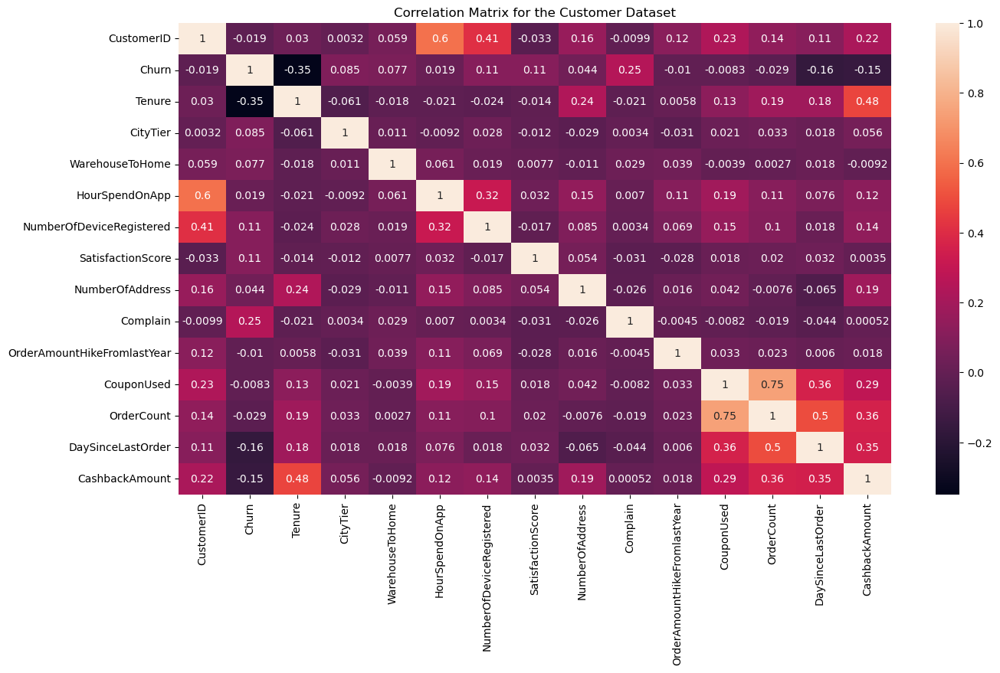

In [16]:
plt.figure(figsize=(15,8))
sns.heatmap(df.corr(numeric_only=True), annot=True)
plt.title("Correlation Matrix for the Customer Dataset")
plt.show()

In [17]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
binary_cat_cols = ['Complain']
outcome = ['Churn']
cat_cols = ['PreferredLoginDevice', 'CityTier', 'PreferredPaymentMode',
       'Gender', 'NumberOfDeviceRegistered', 'PreferedOrderCat',
       'SatisfactionScore', 'MaritalStatus', 'NumberOfAddress', 'Complain']
num_cols = ['Tenure', 'WarehouseToHome', 'HourSpendOnApp', 'OrderAmountHikeFromlastYear', 'CouponUsed', 'OrderCount', 'DaySinceLastOrder', 'CashbackAmount']

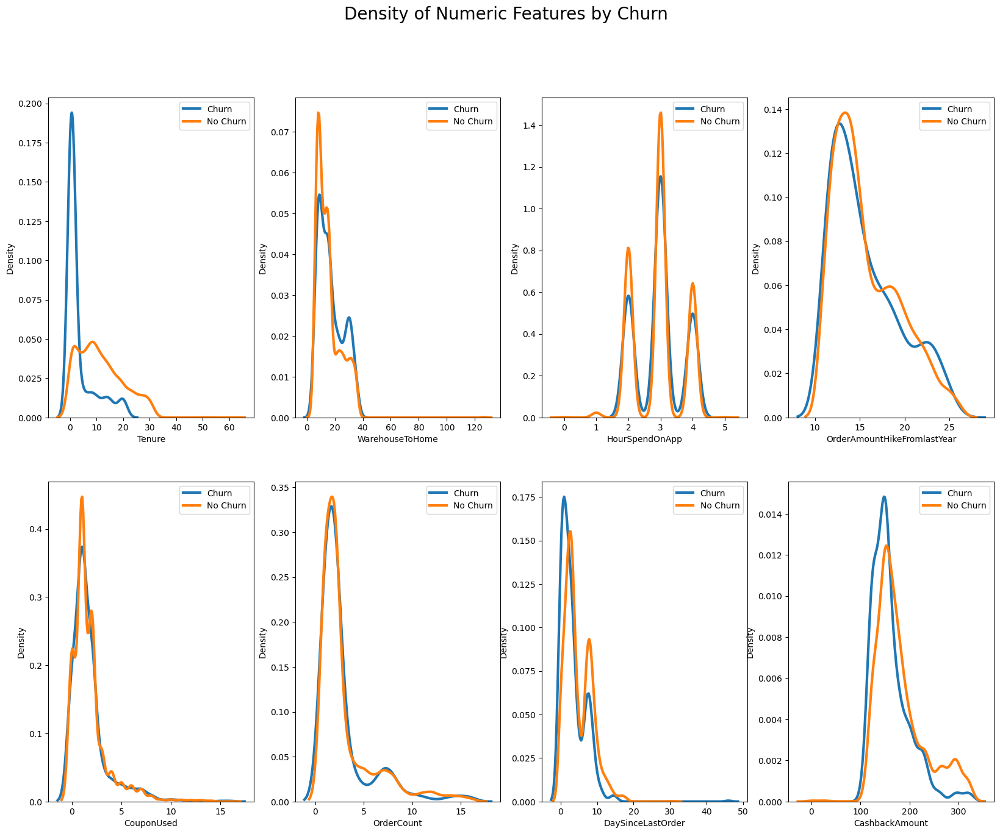

In [18]:
df_c = df[df['Churn']==1].copy()
df_nc = df[df['Churn']==0].copy()

fig, ax = plt.subplots(2,4,figsize=(20, 15))
fig.suptitle('Density of Numeric Features by Churn', fontsize=20)
ax = ax.flatten()

for idx,c in enumerate(num_cols):
    sns.kdeplot(df_c[c], linewidth= 3,
             label = 'Churn',ax=ax[idx])
    sns.kdeplot(df_nc[c], linewidth= 3,
             label = 'No Churn',ax=ax[idx])

    ax[idx].legend(loc='upper right')

plt.show()

### Distributions Insights Of the Numeric Features

Tenure: Customers with longer tenure seem less likely to churn. Makes sense as longer tenure indicates satisfaction.

CityTier: Churn rate looks similar across tiers. City tier does not seem predictive of churn.

WarehouseToHome: Shorter warehouse to home distances have a lower churn rate. Faster deliveries may improve satisfaction.

HourSpendOnApp: More time spent on app correlates with lower churn. App engagement is a good sign.

NumberOfDeviceRegistered: More registered devices associates with lower churn. Access across devices improves convenience.

SatisfactionScore: Higher satisfaction scores strongly associate with lower churn, as expected. Critical driver.

NumberOfAddress: Slight downward trend in churn as number of addresses increases. More addresses indicates loyalty.

Complain: More complaints associate with higher churn, though relationship isn't very strong. Complaints hurt satisfaction.

OrderAmountHikeFromLastYear: Big spenders from last year are less likely to churn. Good to retain big customers.

CouponUsed: Coupon usage correlates with lower churn. Coupons enhance loyalty.

OrderCount: Higher order counts associate with lower churn. Frequent usage builds habits.

DaySinceLastOrder: Longer since last order correlates with higher churn. Recency is a good predictor.

In [19]:
sns.set_theme(context='notebook', style='darkgrid', palette='deep', font='sans-serif', font_scale=1, color_codes=True, rc=None)

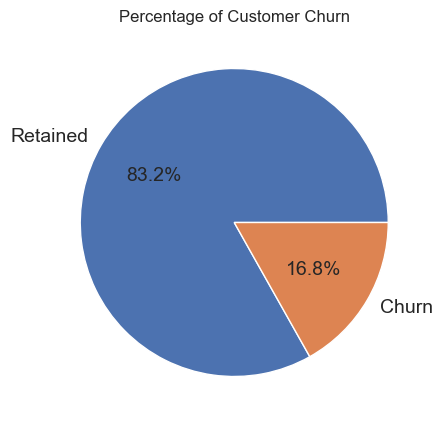

In [20]:
labels = ['Retained','Churn']
counts = df['Churn'].value_counts()
# print(counts)

plt.figure(figsize=(5,5))
plt.title('Percentage of Customer Churn')
plt.pie(counts, autopct='%1.1f%%', labels=labels, textprops={"fontsize":14})
plt.show()

There are more retained than churned customers, the ratio of retained to churned is approximately 5 to 1, so the churn rate is very low, which is normal therefore making the data imbalanced.

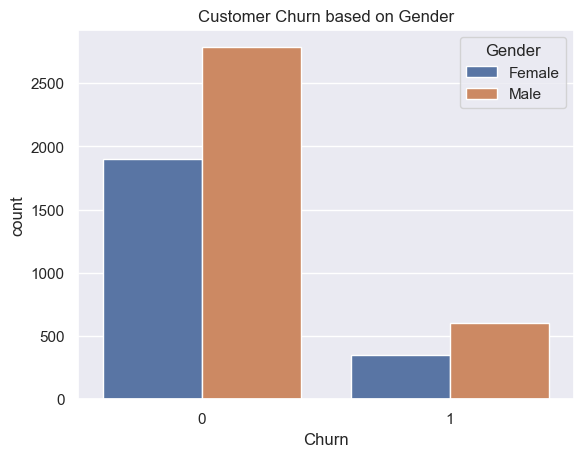

In [21]:
# Which gender most like to churn?
sns.countplot(x=df['Churn'], hue=df['Gender'])
plt.title('Customer Churn based on Gender')
plt.show()

Male customer tends to churn than female, but also likely to retained.

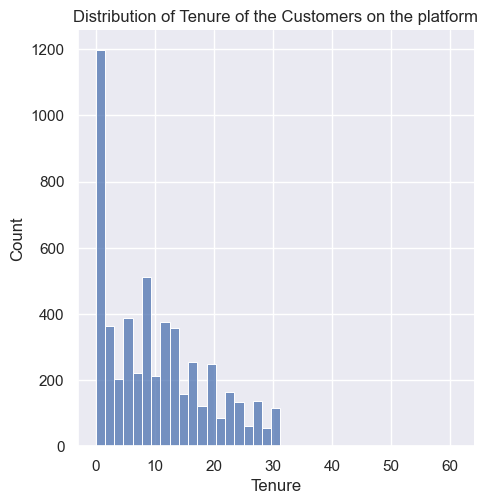

In [22]:

sns.displot(x='Tenure', data=df)
plt.title("Distribution of Tenure of the Customers on the platform")
plt.show()

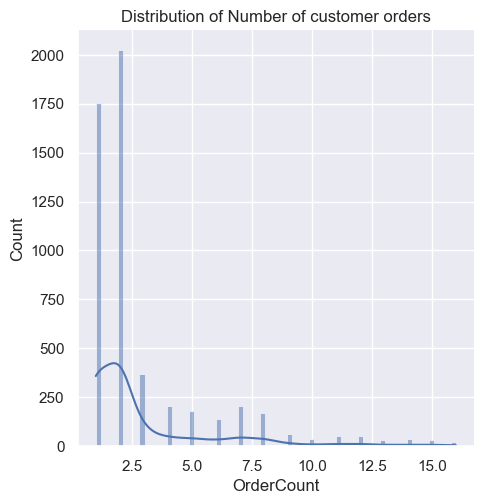

In [23]:
# Distribution of Order Count of customers
sns.displot(x='OrderCount', kde=True, data=df)
plt.title("Distribution of Number of customer orders")
plt.show()

### Distribution of Recency of the customers¶
Recency is gotten from the day since last order of each customer. Customers with low number of days since last order are recent customers and vice versa

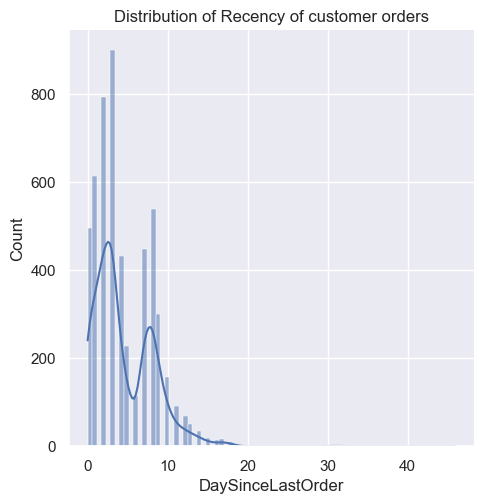

In [24]:
sns.displot(x='DaySinceLastOrder', kde=True, data=df)
plt.title("Distribution of Recency of customer orders")
plt.show()

### Distribution of Amount returned for money spent by customers¶
Cashback is a reward that refunds a percentage of the money spent to by a customer to him/her, It is usually dependent on the amount spent, so the cashback column can be used in place of the amount spent columns.

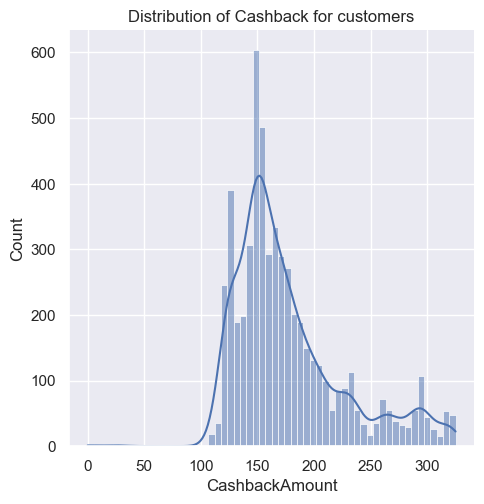

In [25]:
sns.displot(x='CashbackAmount',kde=True, data=df)
plt.title('Distribution of Cashback for customers')
plt.show()

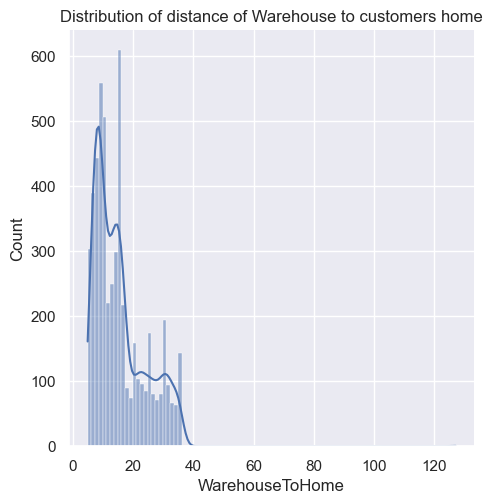

In [26]:
# Distribution of distance of Warehouse to customers home
sns.displot(x='WarehouseToHome', kde=True, data=df)
plt.title("Distribution of distance of Warehouse to customers home")
plt.show()

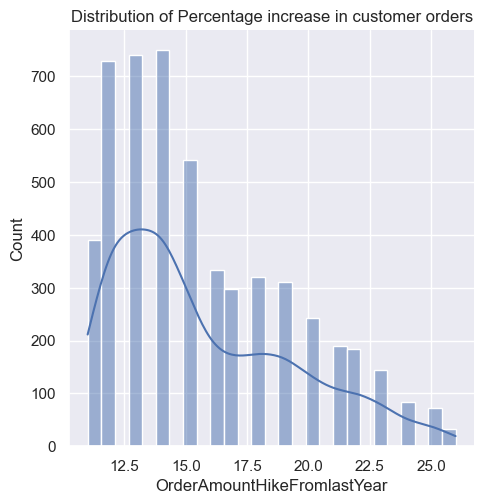

In [27]:
 # Distribution of Percentage increase in customer orders
sns.displot(x='OrderAmountHikeFromlastYear', kde=True, data=df)
plt.title("Distribution of Percentage increase in customer orders")
plt.show()   

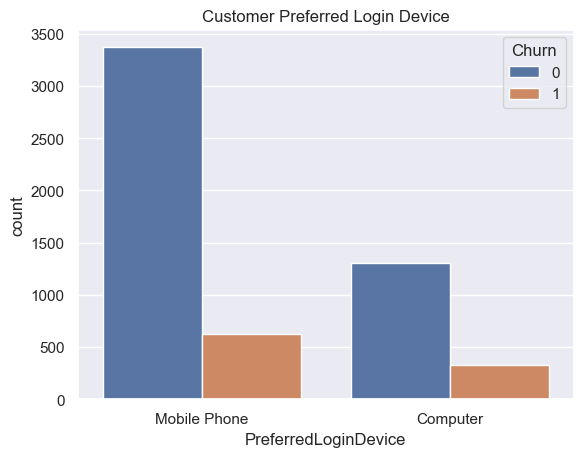

In [28]:
# Customer Preferred Login Device
sns.countplot(x=df['PreferredLoginDevice'], hue=df['Churn'])
plt.title('Customer Preferred Login Device')
plt.show()

Customer prefer mobile phone in compair to computer.

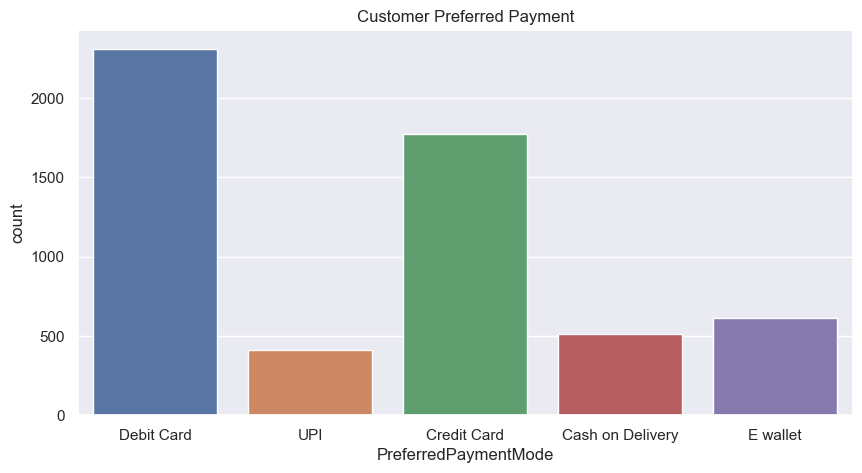

In [29]:
# Customer Preferred Payment
plt.figure(figsize=(10,5))
sns.countplot(x=df['PreferredPaymentMode'])
plt.title('Customer Preferred Payment')
plt.show()

Customers prefer to make payments with debit and credit cards.

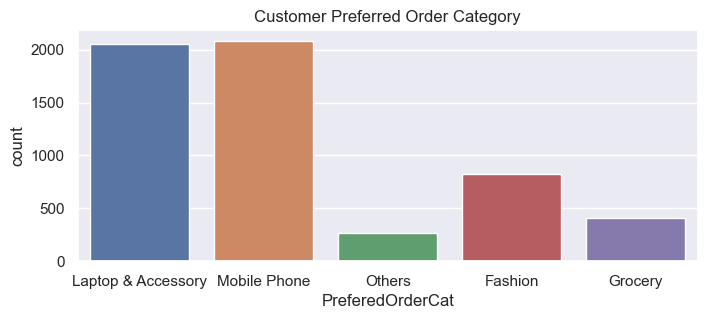

In [30]:
# Customer Preferred Order Category
plt.figure(figsize=(8,3))
sns.countplot(x=df['PreferedOrderCat'])
plt.title('Customer Preferred Order Category')
plt.show()

In this E-commerce, customers order category for Laptop & Accessory is higher than other categories.

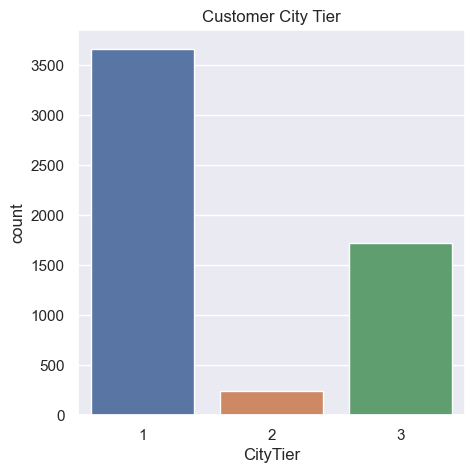

In [31]:
# Customer City Tier
plt.figure(figsize=(5,5))
sns.countplot(x=df['CityTier'])
plt.title('Customer City Tier')
plt.show()

Tier 1 has highest number of customer.

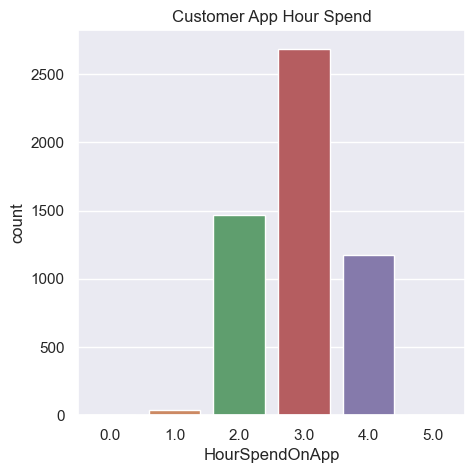

In [32]:
# Customer Hour Spend On App
plt.figure(figsize=(5,5))
sns.countplot(x=df['HourSpendOnApp'])
plt.title('Customer App Hour Spend')
plt.show()

Average Satisfaction Score: 3.066785079928952


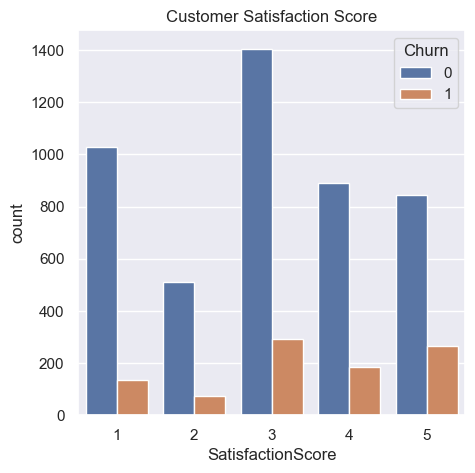

In [33]:
# Customers Satisfaction Score
average_score = df['SatisfactionScore'].mean()
print('Average Satisfaction Score:',average_score)

plt.figure(figsize=(5,5))
sns.countplot(x=df['SatisfactionScore'], hue=df['Churn'])
plt.title('Customer Satisfaction Score')
plt.show()

From scale 1-5 the average satisfaction score is 3.06. Customers satisfaction are neutral.

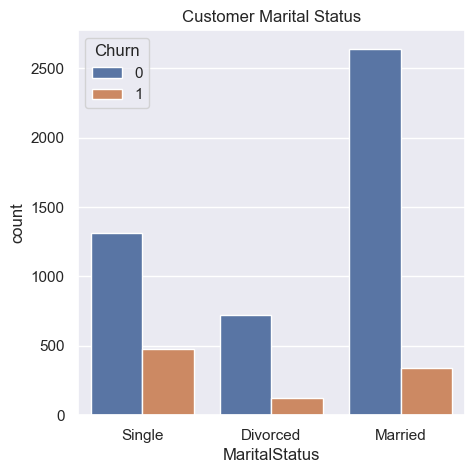

In [34]:
# Customer Marital Status
plt.figure(figsize=(5,5))
sns.countplot(x=df['MaritalStatus'], hue=df['Churn'])
plt.title('Customer Marital Status')
plt.show()

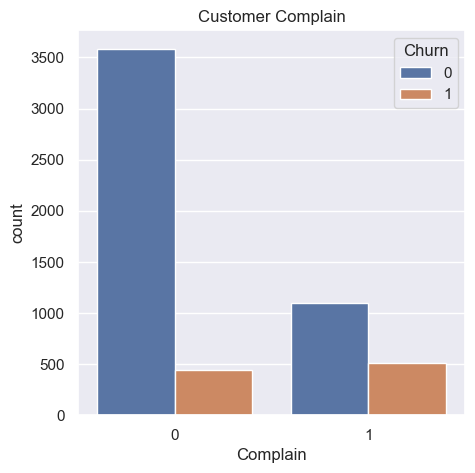

In [35]:
# Customer Complains
plt.figure(figsize=(5,5))
sns.countplot(x=df['Complain'], hue=df['Churn'])
plt.title('Customer Complain')
plt.show()

### Does different citytiers has different prefered products?

In [36]:
import plotly.express as px
earth_palette = ["#A67C52", "#8F704D", "#B09B71", "#7E786E"]


fig=px.histogram(df,x="PreferedOrderCat",facet_col="CityTier",color="CityTier",color_discrete_sequence=earth_palette,text_auto= True , title="<b>"+'CityTier Vs PreferedOrderCat')

# Customize the plot
fig.update_layout(hovermode='x',title_font_size=30)
fig.update_layout(
title_font_color="black",
template="plotly",
title_font_size=30,
hoverlabel_font_size=20,
title_x=0.5,
xaxis_title='PreferredPaymentMode',
yaxis_title='count',
)
fig.show()

laptop & accesories and mobile phones are the prefered category for all the city tiers

### Does the percentage increase in order amount from last year affect churn rate?

In [37]:
df2 = df.copy()
comp_ten = df2.groupby(["OrderAmountHikeFromlastYear", "Churn"]).size().reset_index(name="Count")

# Create a bubble chart using Plotly
fig_bubble = px.scatter(comp_ten, x="OrderAmountHikeFromlastYear", y="Count", size="Count", color="Churn", title="<b>"+'OrderAmountHikeFromlastYear VS Churn',
                        color_discrete_sequence=["#d62728", "#1f77b4"])

# Customize the plot
fig_bubble.update_layout(hovermode='x',title_font_size=30)
fig_bubble.update_layout(
title_font_color="black",
template="plotly",
title_font_size=30,
hoverlabel_font_size=20,
title_x=0.5,
xaxis_title='OrderAmountHikeFromlastYear',
yaxis_title='count',
)
fig_bubble.show()

Graph Show when the percentage of order last year increase the churn rate decrease so OrderAmountHikeFromlastYear has postive effect on Churn rate and we need to focus when customer has percentage 12% - 14%

###    All EDA Insights

There is not a big difference between the males and the females: avg order

The males are more likely to churn as we have 63.3 % churned males from the app may be the company should consider incresing the products that grap the males interest and so on.. we are going to see if there is another factors that makes the highest segment of churned customers are males.

The married are the highest customer segment in the comapny may be the comapny should consider taking care of the products that suits the single and the married customers as the singles are the most likely to churn from the app

Citytier 2 has the highest tenure rate but the tenure rate does not seen to be a strong factor

Citytier 3 has the highest order avg but it not to be a strong factor in the customer churning

People with less satisfaction score spend less time on the app than the people of satisfaction score 5 but also i do not think there is any realation between the satisfaction score and people's spent time on the app

City tier 1 has the most spended hours on the app

There is a negative correlation between CityTier and NumberOfAddress. Higher CityTiers are associated with lower average NumberOfAddress and a more concentrated distribution, Customers in larger cities (CityTier 1) tend to have more addresses on average compared to smaller cities and towns in lower tiers, The relationship suggests address density and type of locality (metro vs smaller cities vs towns) impacts how many addresses customers have across city types.

There is a weak negative relation between complainig and the number of days since last order

mobile phone users are likely to churn may be this indicates a problem on the app user experience on the app mobile version

Inference: As the distance from warehouse to home is similar in all city tier which means company had build warehouse in lower city tier also.

laptop & accesories and mobile phones are the prefered category for all the city tiers

Preferred payment method for CityTier '1' ==> DebitCard
Preferred payment method for CityTier '2' ==> UPI
Preferred payment method for CityTier '3' ==> E wallet
There is big common in debit card method in tiers

CityTier '1' has highest order count with 10298 orders
CityTier '3' has highest mean ordercount that means CityTier '3' thier count small and they have many orders 'richTier'

When the percentage of order last year increase the churn rate decrease so OrderAmountHikeFromlastYear has postive effect on Churn rate and we need to focus when customer has percentage 12% - 15%

customers who didn't made complain has higher DaySinceLastOrder , however it's only one customer so its an outlier if we remove it we will customers with no complain has lower DaySinceLastOrder

Segment of customers has high spendtime on App has OrderCount 2 with percentage 67%

Top 2 Preferd Category For Males == > [ Others , Mobile Phone ]
Top 2 Preferd Category For Females == > [ Grocery , Fashion ]

Churn become less when more coupons used

StatisfactionScore doesn't have affect on OrderCount

There is no relation between cash back amount and ordercount and there is postive relation between cashback amount and churn rate

Complain doesn't affects on Churn, Customers which made complains 68% doesn't make Churn


## Data Preprocessing

### Handling Missing Values

In [38]:
round((df.isnull().sum()*100 / df.shape[0]),2)

CustomerID                     0.00
Churn                          0.00
Tenure                         4.69
PreferredLoginDevice           0.00
CityTier                       0.00
WarehouseToHome                4.46
PreferredPaymentMode           0.00
Gender                         0.00
HourSpendOnApp                 4.53
NumberOfDeviceRegistered       0.00
PreferedOrderCat               0.00
SatisfactionScore              0.00
MaritalStatus                  0.00
NumberOfAddress                0.00
Complain                       0.00
OrderAmountHikeFromlastYear    4.71
CouponUsed                     4.55
OrderCount                     4.58
DaySinceLastOrder              5.45
CashbackAmount                 0.00
dtype: float64

<Axes: >

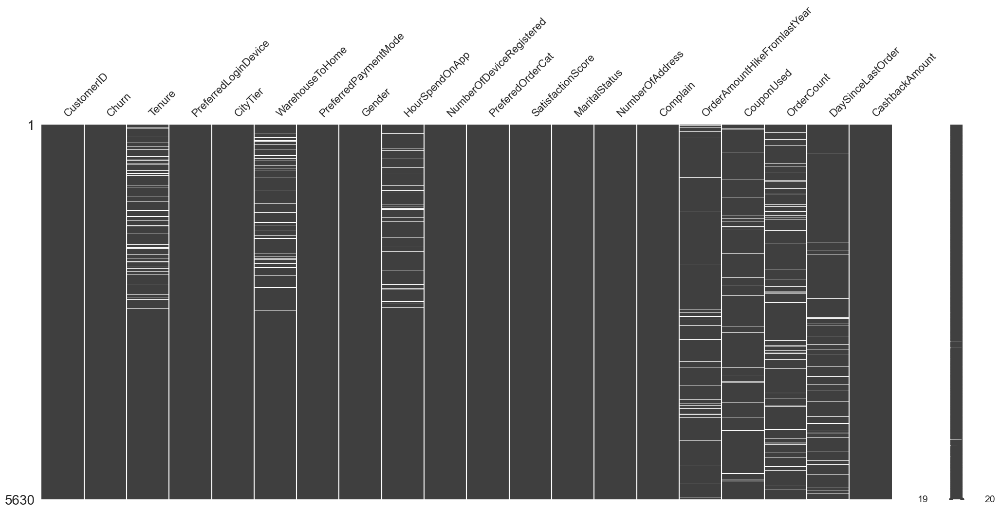

In [39]:
msno.matrix(df)

<Axes: >

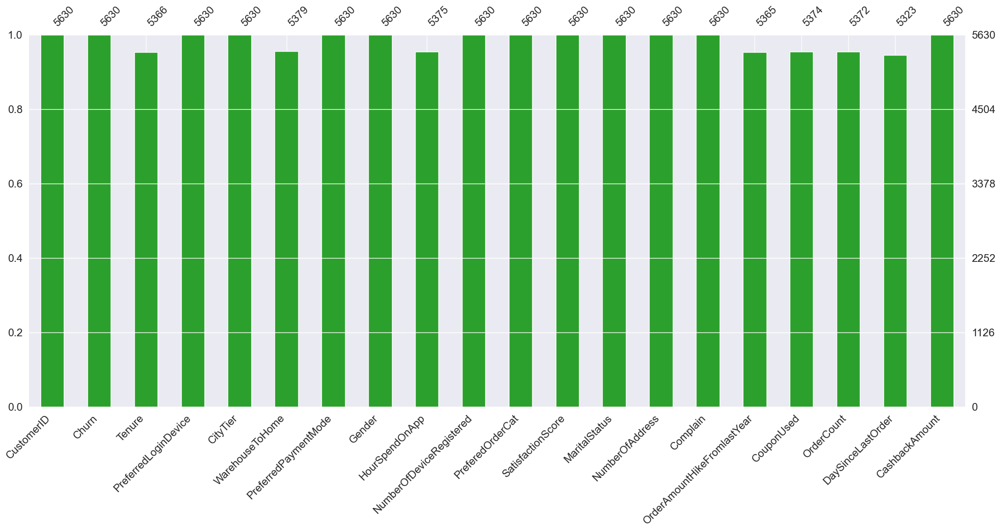

In [40]:
msno.bar(df , color="tab:green")

In [41]:
# Now let's fill those missing values
for col in df.columns:
    if df[col].isnull().sum() > 0:
        df[col].fillna(df[col].median(), inplace=True)
        
# Done. Checking the missing values for the last time
df.isnull().sum()

CustomerID                     0
Churn                          0
Tenure                         0
PreferredLoginDevice           0
CityTier                       0
WarehouseToHome                0
PreferredPaymentMode           0
Gender                         0
HourSpendOnApp                 0
NumberOfDeviceRegistered       0
PreferedOrderCat               0
SatisfactionScore              0
MaritalStatus                  0
NumberOfAddress                0
Complain                       0
OrderAmountHikeFromlastYear    0
CouponUsed                     0
OrderCount                     0
DaySinceLastOrder              0
CashbackAmount                 0
dtype: int64

### Feture Ingi

In [44]:
from category_encoders import TargetEncoder

# Create a target encoder object
encoder = TargetEncoder()

# Encode for cat_cols
for i in df.columns:
    if df[i].dtype == 'object':
        df[i] = encoder.fit_transform(df[i],df['Churn'])

df.head()

,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,50001,1,4.0,0.156156,3,6.0,0.153846,0.154942,3.0,3,0.102439,2,0.267261,9,1,11.0,1.0,1.0,5.0,159.93
1,50002,1,9.0,0.156156,1,8.0,0.173913,0.177305,3.0,4,0.274038,3,0.267261,7,1,15.0,0.0,1.0,0.0,120.90
2,50003,1,9.0,0.156156,1,30.0,0.153846,0.177305,2.0,4,0.274038,3,0.267261,6,1,14.0,0.0,1.0,3.0,120.28
3,50004,1,0.0,0.156156,3,15.0,0.153846,0.177305,2.0,4,0.102439,5,0.267261,8,0,23.0,0.0,1.0,3.0,134.07
4,50005,1,0.0,0.156156,1,12.0,0.142052,0.177305,3.0,3,0.274038,5,0.267261,3,0,11.0,1.0,1.0,3.0,129.60


### Handling Outliers

In [45]:
df.dtypes

CustomerID                       int64
Churn                            int64
Tenure                         float64
PreferredLoginDevice           float64
CityTier                         int64
WarehouseToHome                float64
PreferredPaymentMode           float64
Gender                         float64
HourSpendOnApp                 float64
NumberOfDeviceRegistered         int64
PreferedOrderCat               float64
SatisfactionScore                int64
MaritalStatus                  float64
NumberOfAddress                  int64
Complain                         int64
OrderAmountHikeFromlastYear    float64
CouponUsed                     float64
OrderCount                     float64
DaySinceLastOrder              float64
CashbackAmount                 float64
dtype: object

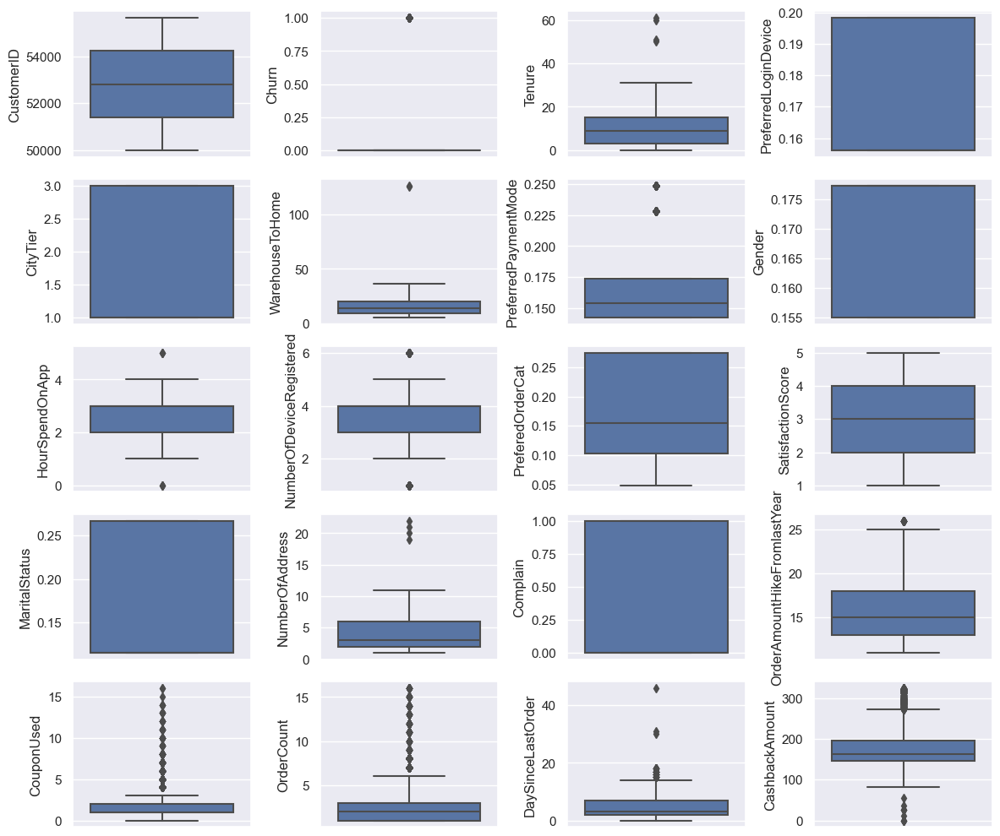

In [46]:
fig = plt.figure(figsize=(12,18))
for i in range(len(df.columns)):
    fig.add_subplot(9,4,i+1)
    sns.boxplot(y=df.iloc[:,i])

plt.tight_layout()
plt.show()

In [47]:
# lets detect True Outliers
def handle_outliers(df , column_name):
    Q1 = df[column_name].quantile(0.25)
    Q3 = df[column_name].quantile(0.75)
    IQR = Q3 - Q1

  # Define Upper and lower boundaries
    Upper = Q3 + IQR * 1.5
    lower = Q1 - IQR * 1.5

  # lets make filter for col values
    new_df = df[ (df[column_name] > lower) & (df[column_name] < Upper) ]

    return new_df

In [48]:
# lets Give our Functions columnscontains outlier
cols_outliers = ['Tenure' , 'WarehouseToHome' , 'NumberOfAddress' , 'DaySinceLastOrder' , 'HourSpendOnApp' , 'NumberOfDeviceRegistered']

for col in cols_outliers:
    df = handle_outliers(df , col)

df.head()

,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,50001,1,4.0,0.156156,3,6.0,0.153846,0.154942,3.0,3,0.102439,2,0.267261,9,1,11.0,1.0,1.0,5.0,159.93
1,50002,1,9.0,0.156156,1,8.0,0.173913,0.177305,3.0,4,0.274038,3,0.267261,7,1,15.0,0.0,1.0,0.0,120.90
2,50003,1,9.0,0.156156,1,30.0,0.153846,0.177305,2.0,4,0.274038,3,0.267261,6,1,14.0,0.0,1.0,3.0,120.28
3,50004,1,0.0,0.156156,3,15.0,0.153846,0.177305,2.0,4,0.102439,5,0.267261,8,0,23.0,0.0,1.0,3.0,134.07
4,50005,1,0.0,0.156156,1,12.0,0.142052,0.177305,3.0,3,0.274038,5,0.267261,3,0,11.0,1.0,1.0,3.0,129.60


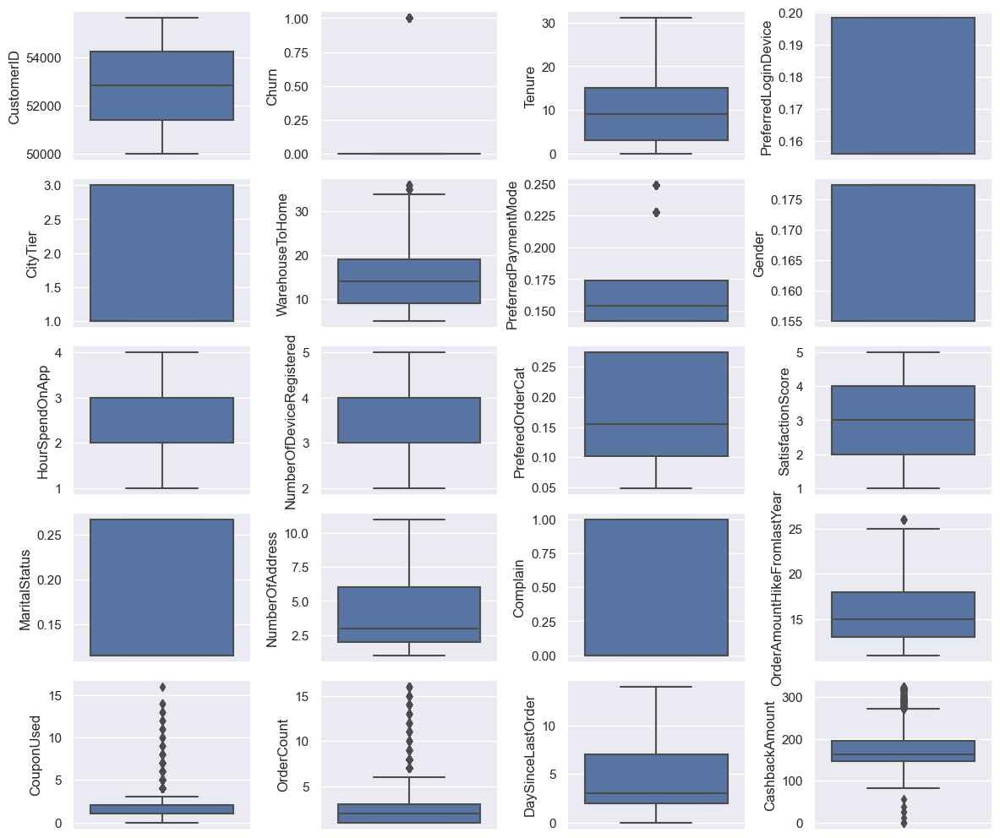

In [49]:
fig = plt.figure(figsize=(12,18))
for i in range(len(df.columns)):
    fig.add_subplot(9,4,i+1)
    sns.boxplot(y=df.iloc[:,i])

plt.tight_layout()
plt.show()

we made Trim on cols that contains outliers but after we check we saw many inforamtion deleted so we made Trimming only on cols that not conatins many outliers

In [50]:
corr_matrix = df.corr()
corr_matrix

,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
CustomerID,1.000000,-0.037495,0.039010,-0.002295,-0.004911,0.065470,-0.004296,0.005274,0.582594,0.374506,0.000965,-0.029340,-0.051810,0.162806,-0.009330,0.108710,0.235466,0.129165,0.112037,0.214406
Churn,-0.037495,1.000000,-0.335950,0.040957,0.069710,0.069827,0.091744,0.038218,0.001628,0.079158,0.232830,0.108536,0.172403,0.033847,0.252183,-0.005435,-0.010879,-0.031473,-0.170018,-0.164738
Tenure,0.039010,-0.335950,1.000000,-0.034389,-0.065964,-0.025498,-0.014525,-0.056726,-0.009715,-0.015321,-0.363933,-0.013585,-0.121561,0.251835,-0.024084,-0.006287,0.110453,0.170853,0.169273,0.466986
PreferredLoginDevice,-0.002295,0.040957,-0.034389,1.000000,-0.010526,0.016510,-0.037149,0.012763,-0.020561,0.005138,-0.004045,-0.037431,0.006812,-0.033814,-0.005691,0.005279,0.018468,0.020105,0.026910,-0.043034
CityTier,-0.004911,0.069710,-0.065964,-0.010526,1.000000,0.005526,0.325026,-0.022697,-0.010884,0.007364,-0.230039,-0.009822,0.017298,-0.033113,0.006177,-0.026584,0.019766,0.037717,0.011836,0.045271
WarehouseToHome,0.065470,0.069827,-0.025498,0.016510,0.005526,1.000000,0.017422,-0.014911,0.064090,0.017773,-0.063026,0.014424,-0.036197,-0.007870,0.026709,0.043123,0.005795,-0.001236,0.027259,0.007512
PreferredPaymentMode,-0.004296,0.091744,-0.014525,-0.037149,0.325026,0.017422,1.000000,0.004640,-0.001632,0.023945,-0.049525,0.027392,-0.004530,-0.018628,-0.001525,-0.056118,0.019349,-0.004228,0.018361,-0.006591
Gender,0.005274,0.038218,-0.056726,0.012763,-0.022697,-0.014911,0.004640,1.000000,-0.013508,-0.021172,0.055518,-0.037507,-0.034531,-0.030499,-0.030809,-0.010556,-0.022730,-0.027854,-0.026917,-0.024238
HourSpendOnApp,0.582594,0.001628,-0.009715,-0.020561,-0.010884,0.064090,-0.001632,-0.013508,1.000000,0.274373,0.080689,0.030149,-0.055762,0.137217,-0.002155,0.099685,0.190460,0.105335,0.076904,0.116623
NumberOfDeviceRegistered,0.374506,0.079158,-0.015321,0.005138,0.007364,0.017773,0.023945,-0.021172,0.274373,1.000000,0.009238,-0.000990,0.037792,0.071168,-0.001841,0.057038,0.139823,0.090910,0.008722,0.120149


<Axes: >

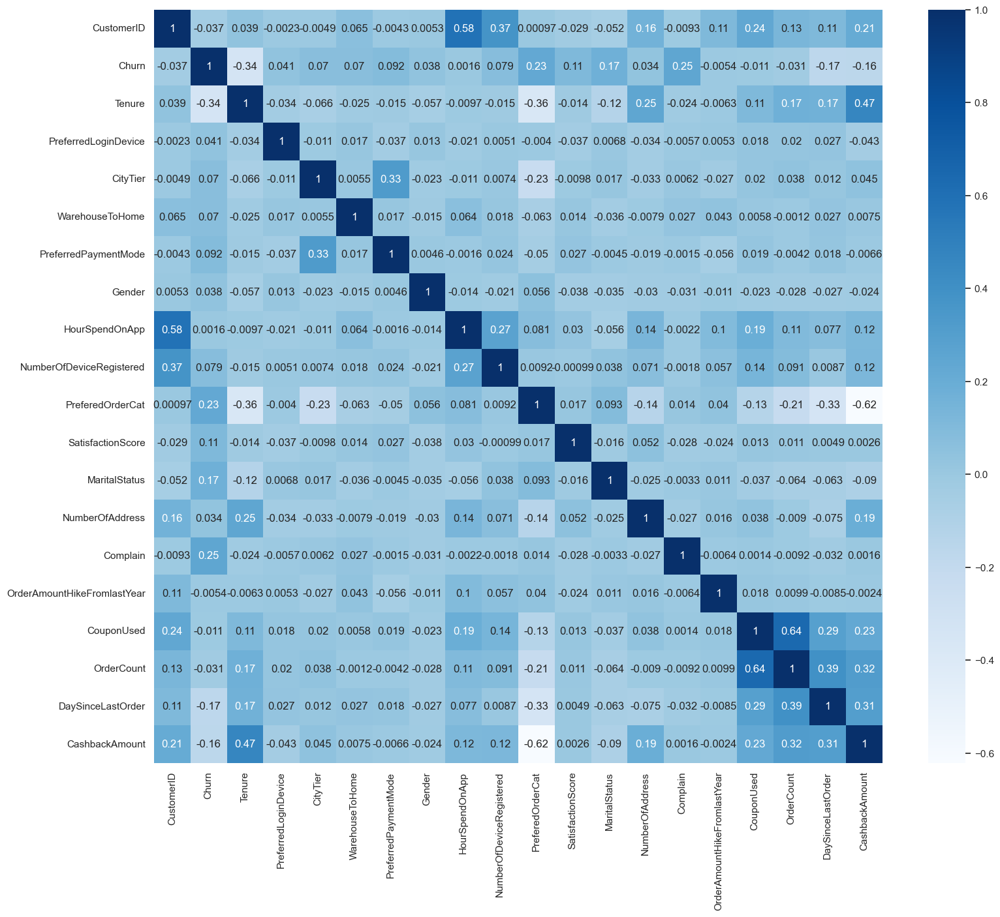

In [51]:
plt.figure(figsize = (18,15))
sns.heatmap(df.corr() , annot = True , cmap = 'Blues')

In [52]:
churn_corr_vector = corr_matrix['Churn'].sort_values(ascending = False)
churn_corr_vector

Churn                          1.000000
Complain                       0.252183
PreferedOrderCat               0.232830
MaritalStatus                  0.172403
SatisfactionScore              0.108536
PreferredPaymentMode           0.091744
NumberOfDeviceRegistered       0.079158
WarehouseToHome                0.069827
CityTier                       0.069710
PreferredLoginDevice           0.040957
Gender                         0.038218
NumberOfAddress                0.033847
HourSpendOnApp                 0.001628
OrderAmountHikeFromlastYear   -0.005435
CouponUsed                    -0.010879
OrderCount                    -0.031473
CustomerID                    -0.037495
CashbackAmount                -0.164738
DaySinceLastOrder             -0.170018
Tenure                        -0.335950
Name: Churn, dtype: float64

Text(0.5, 1.0, 'Relation Between Features and target')

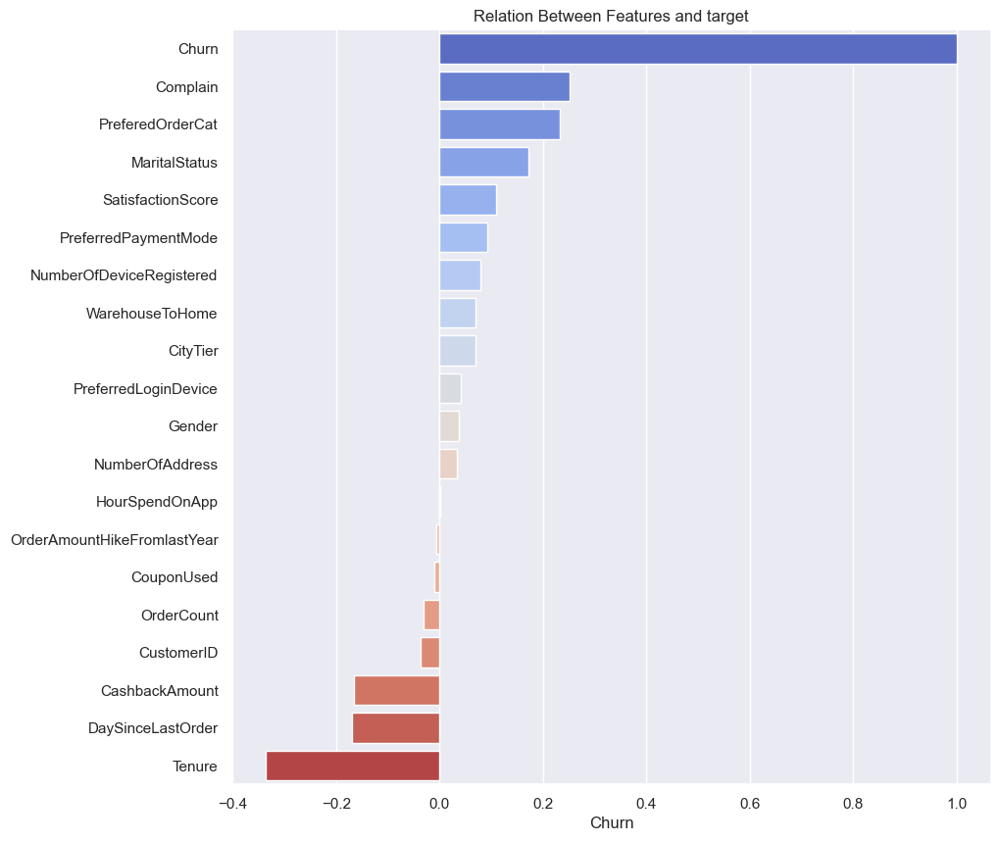

In [53]:
plt.figure(figsize = (10,10))
sns.barplot(x = churn_corr_vector , y = churn_corr_vector.index , palette = 'coolwarm')
plt.title('Relation Between Features and target')

In [54]:
fig = px.histogram(df2, x="Churn", color="Churn" ,text_auto= True , title="<b>"+'Check Imbalance' , color_discrete_sequence = ['#BA1F33','#3A506B'])

# Customize the plot
fig.update_layout(hovermode='x',title_font_size=30)
fig.update_layout(
title_font_color="black",
template="plotly",
title_font_size=30,
hoverlabel_font_size=20,
title_x=0.5,
xaxis_title='Churn',
yaxis_title='count',
)
fig.show()

Our Data Imbalanced so lets make Over sample for it Using SMOTETomek

In [57]:
X = df.drop(['Churn','CustomerID'], axis = 1)
Y = df['Churn']

In [58]:
X.head()

,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,4.0,0.156156,3,6.0,0.153846,0.154942,3.0,3,0.102439,2,0.267261,9,1,11.0,1.0,1.0,5.0,159.93
1,9.0,0.156156,1,8.0,0.173913,0.177305,3.0,4,0.274038,3,0.267261,7,1,15.0,0.0,1.0,0.0,120.90
2,9.0,0.156156,1,30.0,0.153846,0.177305,2.0,4,0.274038,3,0.267261,6,1,14.0,0.0,1.0,3.0,120.28
3,0.0,0.156156,3,15.0,0.153846,0.177305,2.0,4,0.102439,5,0.267261,8,0,23.0,0.0,1.0,3.0,134.07
4,0.0,0.156156,1,12.0,0.142052,0.177305,3.0,3,0.274038,5,0.267261,3,0,11.0,1.0,1.0,3.0,129.60


In [59]:
Y.head()

0    1
1    1
2    1
3    1
4    1
Name: Churn, dtype: int64

### Handling Imbalanced Data

In [61]:
from imblearn.combine import SMOTETomek
smt = SMOTETomek(random_state=42)
x_over , y_over = smt.fit_resample(X , Y)

In [62]:
x_over.shape, y_over.shape

((8584, 18), (8584,))

### Split Data

In [63]:
x_train , x_test , y_train , y_test = train_test_split(x_over , y_over , test_size = 0.30 , random_state = 42)

In [64]:
# Now we  will make normalization for all data to make them in commom range
from sklearn.preprocessing import MinMaxScaler , StandardScaler , RobustScaler

MN = MinMaxScaler()
# SC = StandardScaler()
# Rb = RobustScaler()
x_train_scaled = MN.fit_transform(x_train)
x_test_scaled = MN.fit_transform(x_test)

## Model Development

### Logistic regression

Accuracy = 0.7729037267080745
ROC Area under Curve = 0.7729750828111484
              precision    recall  f1-score   support

           0    0.78219   0.75985   0.77086      1295
           1    0.76404   0.78610   0.77491      1281

    accuracy                        0.77290      2576
   macro avg    0.77312   0.77298   0.77289      2576
weighted avg    0.77316   0.77290   0.77287      2576

**********************************************************************


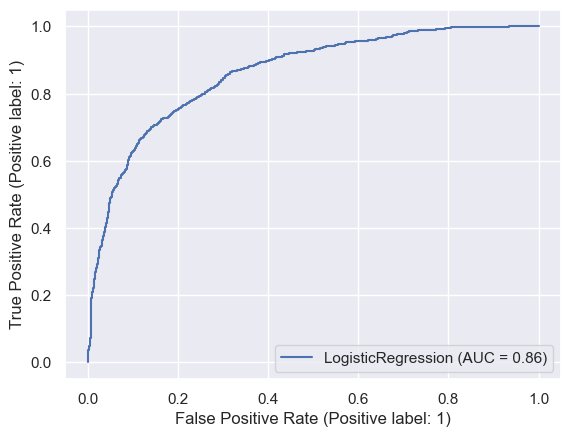

In [70]:

model= LogisticRegression()
model.fit(x_train_scaled,y_train)
y_pred = model.predict(x_test_scaled)
accuracy = accuracy_score(y_test, y_pred)
roc_auc1 = roc_auc_score(y_test, y_pred)
print("Accuracy = {}".format(accuracy))
print("ROC Area under Curve = {}".format(roc_auc1))
print(classification_report(y_test,y_pred,digits=5))
print('*' * 70)
RocCurveDisplay.from_estimator(model , x_test_scaled , y_test)

Confusion Matrix


<Axes: >

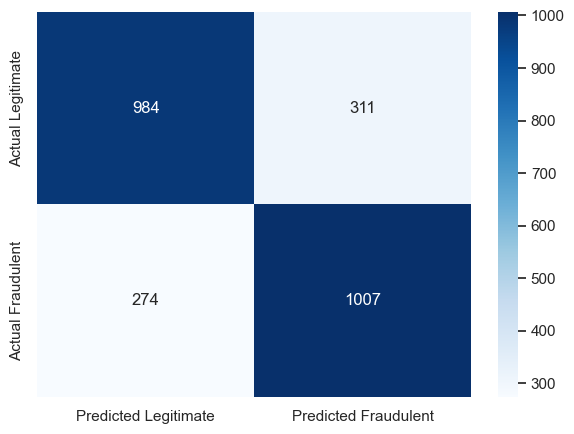

In [73]:
print("Confusion Matrix")
cm=metrics.confusion_matrix(y_test, y_pred, labels=[0,1])

df_cm = pd.DataFrame(cm, index = [i for i in ['True Label','True Label']],
                  columns = [i for i in ['Predicted Label' ,'Predicted Label']])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True, fmt='g', cmap='Blues')

###  Random forest

Accuracy = 0.9774844720496895
ROC Area under Curve = 0.9775217840791611
              precision    recall  f1-score   support

           0    0.98434   0.97066   0.97745      1295
           1    0.97075   0.98439   0.97752      1281

    accuracy                        0.97748      2576
   macro avg    0.97754   0.97752   0.97748      2576
weighted avg    0.97758   0.97748   0.97748      2576

**********************************************************************


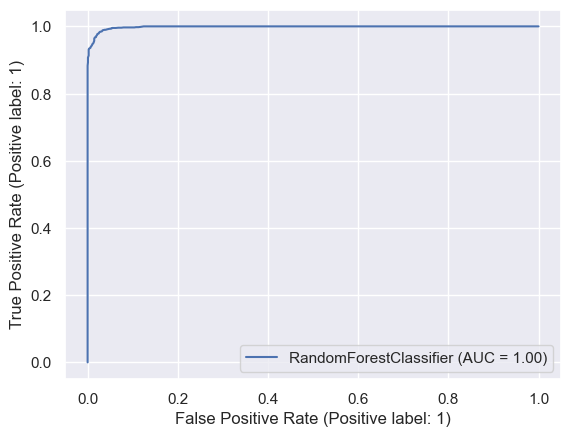

In [74]:
model=RandomForestClassifier()
model.fit(x_train_scaled,y_train)
y_pred = model.predict(x_test_scaled)
accuracy = accuracy_score(y_test, y_pred)
roc_auc4 = roc_auc_score(y_test, y_pred)
print("Accuracy = {}".format(accuracy))
print("ROC Area under Curve = {}".format(roc_auc4))
print(classification_report(y_test,y_pred,digits=5))
print('*' * 70)
RocCurveDisplay.from_estimator(model , x_test_scaled , y_test)

Confusion Matrix


<Axes: >

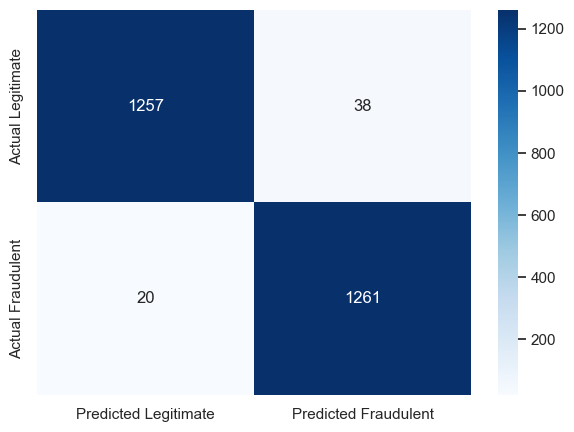

In [75]:
print("Confusion Matrix")
cm=metrics.confusion_matrix(y_test, y_pred, labels=[0,1])

df_cm = pd.DataFrame(cm, index = [i for i in ['True Label','True Label']],
                  columns = [i for i in ['Predicted Label' ,'Predicted Label']])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True, fmt='g', cmap='Blues')

### XGBoost

Accuracy = 0.9786490683229814
ROC Area under Curve = 0.9787180623246198
              precision    recall  f1-score   support

           0    0.99128   0.96602   0.97849      1295
           1    0.96651   0.99141   0.97881      1281

    accuracy                        0.97865      2576
   macro avg    0.97890   0.97872   0.97865      2576
weighted avg    0.97897   0.97865   0.97865      2576

**********************************************************************


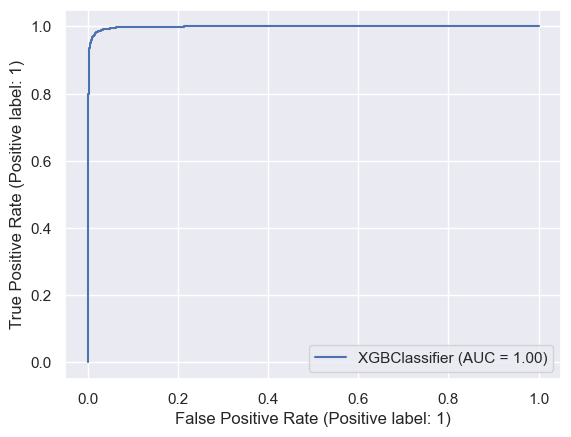

In [76]:
model=XGBClassifier()
model.fit(x_train_scaled,y_train)
y_pred = model.predict(x_test_scaled)
accuracy = accuracy_score(y_test, y_pred)
roc_auc5 = roc_auc_score(y_test, y_pred)
print("Accuracy = {}".format(accuracy))
print("ROC Area under Curve = {}".format(roc_auc5))
print(classification_report(y_test,y_pred,digits=5))
print('*' * 70)
RocCurveDisplay.from_estimator(model , x_test_scaled , y_test)

Confusion Matrix


<Axes: >

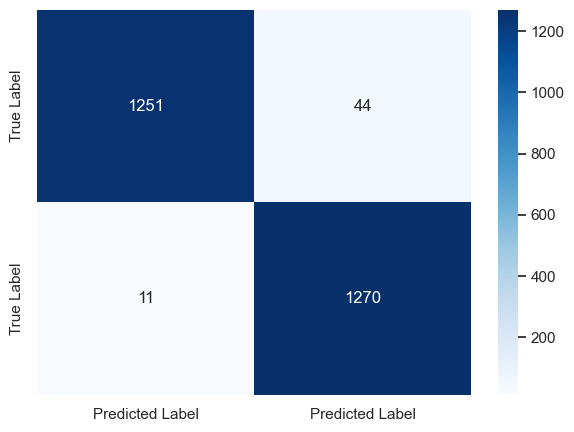

In [79]:
print("Confusion Matrix")
cm=metrics.confusion_matrix(y_test, y_pred, labels=[0,1])

df_cm = pd.DataFrame(cm, index = [i for i in ['True Label','True Label']],
                  columns = [i for i in ['Predicted Label' ,'Predicted Label']])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True, fmt='g', cmap='Blues')

Conclusion:
From above model Evaluation XGboost has highest % of accuracy i.e 97%.


### Hyperparameter Tuning

The XGboost models performed better than the Other models. 

So I will tune the hyperparameters to reduce overfitting and improve test performance.

I will use BayesSearchCV from the scikit-optimize library for tuning the hyperparameters

In [82]:
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [3, 4, 5],
    'colsample_bytree': [0.3, 0.5, 0.7],
    'gamma': [0.0, 0.1, 0.2]
}

In [83]:
# Create a XGBClassifier object
xgb_clf = XGBClassifier()

In [84]:
# Create a GridSearchCV object
grid_search = GridSearchCV(estimator=xgb_clf, param_grid=param_grid, cv=3, scoring='accuracy', verbose=2, n_jobs=-1)

In [85]:
# Fit the GridSearchCV object to the data
grid_search.fit(x_train_scaled, y_train)

Fitting 3 folds for each of 243 candidates, totalling 729 fits


GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, ...),
             n_jobs=-1,
             param_grid={'colsample_bytree': [0.3, 0.5, 0.7],
                         'gamma': [0.0, 0.1, 0.2],
                         'learning_rate': [0.01, 0.05, 0.1],
                         'max_depth': [3, 4, 5],
                         'n_estimators': [100, 200, 300]},
             scoring='accuracy', verbose=2)

In [86]:
# Get the best parameters
best_parameters = grid_search.best_params_

In [87]:
# Get the best score
best_score = grid_search.best_score_

In [88]:
# Print the best parameters and best score
print("Best Parameters:", best_parameters)
print("Best Score:", best_score)

Best Parameters: {'colsample_bytree': 0.7, 'gamma': 0.1, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 300}
Best Score: 0.9722041978657056


Accuracy = 0.9604037267080745
ROC Area under Curve = 0.9605544654724982
              precision    recall  f1-score   support

           0    0.98774   0.93282   0.95949      1295
           1    0.93570   0.98829   0.96128      1281

    accuracy                        0.96040      2576
   macro avg    0.96172   0.96055   0.96038      2576
weighted avg    0.96186   0.96040   0.96038      2576

**********************************************************************


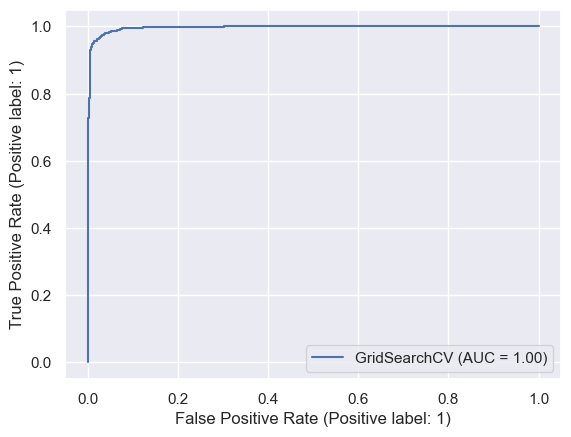

In [90]:
y_pred = grid_search.predict(x_test_scaled)
accuracy = accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred)
print("Accuracy = {}".format(accuracy))
print("ROC Area under Curve = {}".format(roc_auc))
print(classification_report(y_test,y_pred,digits=5))
print('*' * 70)
RocCurveDisplay.from_estimator(grid_search , x_test_scaled , y_test)

Confusion Matrix


<Axes: >

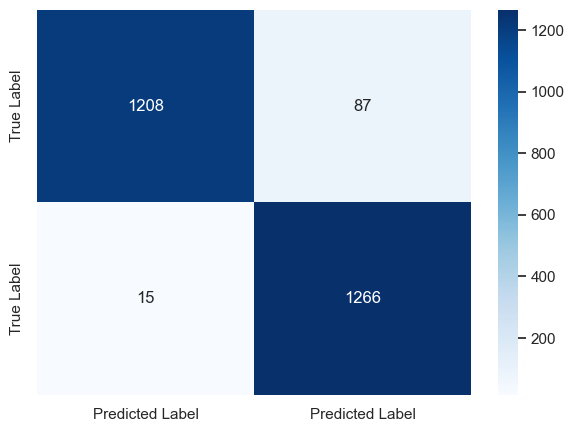

In [91]:
print("Confusion Matrix")
cm=metrics.confusion_matrix(y_test, y_pred, labels=[0,1])

df_cm = pd.DataFrame(cm, index = [i for i in ['True Label','True Label']],
                  columns = [i for i in ['Predicted Label' ,'Predicted Label']])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True, fmt='g', cmap='Blues')

### Conclusion
After building the 3 models,  XGBoost performing best with a test f1-score of 97.8%.

Then i  tuned the xgboost hyperparameters ,Which result are follow:
accuracy : 96% ,  precision : 96.10% ,f1 score : 96%.

### Recommendations

Should consider that the higher percntage are males incresing the products that grap the males interest and so on.\
May be the comapny should consider taking care of the products that suits the single and the married customers as the single are more likly to churn

The company should consider the products that not that expensive or that cheap so that the medium city tier 2 can trust buying it cause as a medium tier customer i wo't afford buying expensive products and i won't trust buying cheap products as they won't meet my needs

The company should think of another technique other than satisfaction score or complaining may be a hot line to recive the complains to get fast results or provied regular phone calls to recive feedback from the customers

The company should check the mobile version of the store to see if there is any problem with the ui/ux

Once the customer has reached 12%-15% orderamount the company should consider focusing more on grap their attention with the products they like

For customers who have just bought electronic goods,cross-selling can be done by offering electronic accessories, such as keyboards, mice, etc.


